In [4]:
!jt -t oceans16 -tfs 14 -fs 16 -cursw 2 -cursc r -cellw 90% -T -mathfs 110 -lineh 150
plot_theme = 'chesterish'

In [2]:
from numpy import *
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.pylab as p
from mpl_toolkits.mplot3d import Axes3D; 
import pandas as pd
import math
from IPython.display import Markdown as md
from IPython.display import display, Math # Formato LaTeX en print

In [3]:
#Parámetros de Gráficas
#parámetros matplotlib
from jupyterthemes import jtplot
jtplot.style(theme=plot_theme, context = 'talk', ticks = True, grid = False, fscale = 2)


if plot_theme == 'chesterish' or plot_theme == 'onedork': color_text = 'white'
elif plot_theme == 'grade3': color_text = 'black'
    
plt.rcParams.update({'text.usetex': True,'font.family' : 'serif', 'font.weight' : 'bold',
                     'text.color' : color_text, 'axes.labelcolor' : color_text,
                     'xtick.color' : color_text, 'ytick.color' : color_text,
                     'figure.dpi' : 100, 'savefig.format' : 'jpg', 'savefig.bbox' : 'tight',
#                      'axes.titlesize' : 32, 'font.size' : 10, 'lines.linewidth': 3
                    })


#plotly params
import plotly.graph_objects as go
import plotly.io as pio
pio.templates

if plot_theme == 'chesterish' or plot_theme == 'onedork': template = 'plotly_dark'
elif plot_theme == 'grade3': template = 'seaborn'

## Obtener el potencial dentro del arreglo de la figura siguiente utilizando:
$$\nabla^2V(x) = 0$$
$$V_{i,j} = \frac{1}{4}[V_{i+1,j} + V_{i-1,j} + V_{i,j+1} + V_{i,j-1}]$$ 


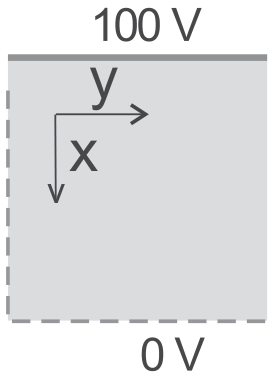

In [6]:
#Import library
from IPython.display import Image# Load image from local storage
Image(filename = "images/5.2probl.png", height = 200)

In [4]:
#LaplaceLine resuelve la ecuación de Laplace por relajación.

def LaplaceLine(N = 100, Niter = 600):
    V = zeros((N, N), float);
    for k in range(0, N): V[0, k] = 100.
    for k in range(0, N): V[-1, k] = 0.
        
    for iter in range(Niter):
        for i in range(1, N - 1):
            for j in range(1, N - 1):
                V[i,j] = 0.25*(V[i+1,j] + V[i-1,j] + V[i,j+1] + V[i,j-1])
    
    
    
    x = range(N); y = range(N)
    X, Y = p.meshgrid(x, y)

    def functz(V):
        z = V[X,Y]
        return z

    Z = functz(V)
    return X, Y, Z

x,y,v = LaplaceLine()
#Gráfica con Plotly
fig = go.Figure(
    go.Surface(x=x, y=y, z = v,
               contours = {"x": {"show": True, "start": 2, "end": 100, "size": 5, "color":"black"},
                           "y": {"show": True, "start": 2, "end": 100, "size": 5, "color":"black"},
                           "z": {"show": True, "start": 0, "end": 100,  "size": 10, "color":"black"}}
              )
)
fig.update_layout(
                  autosize=False,
                  margin=dict(l=20, r=20, t=20, b=20),
                  width=800, height=700,
                  paper_bgcolor='rgba(0,0,0,0)',
                  template = template,
                  scene_aspectmode='cube',
                  scene = dict( 
                      xaxis = dict(nticks=3),
                      yaxis = dict(nticks=3),
                      zaxis = dict(nticks=3),
                      zaxis_title = 'V(x,y)'
                              )
                  )
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))
fig.show()

In [59]:
#LaplaceLine resuelve la ecuación de Laplace por relajación.

def LaplaceLine(N = 100, Max_iter = 1000):
    V = zeros((N, N), float);
    for k in range(0, N): V[0, k] = 100.
    for k in range(0, N): V[-1, k] = 0.
    
    α = 2/(1 + (pi/N))
    Vold = V; Vnew= zeros((N,N), float);
    ΔV = 100*ones((N,N),float)
    
    iteration = 0
    while (iteration <= Max_iter) and (diff > 0.001 for diff in ΔV):
        for i in range(1, N - 1):
            for j in range(1, N - 1):
                Vnew[i,j] = 0.25*(Vold[i+1,j] + Vold[i-1,j] + Vold[i,j+1] + Vold[i,j-1])
                
        ΔV = np.abs(Vnew - Vold)
        Vnew = Vold + α*ΔV
        Vold = Vnew
        iteration += 1
    
    V = Vold
    x = range(N); y = range(N)
    X, Y = p.meshgrid(x, y)
    Z = V[X,Y]
    
    return X, Y, Z, iteration

x,y,v, iteration = LaplaceLine()
#Gráfica con Plotly
fig = go.Figure(
    go.Surface(x=x, y=y, z = v,
               contours = {"x": {"show": True, "start": 2, "end": 100, "size": 5, "color":"black"},
                           "y": {"show": True, "start": 2, "end": 100, "size": 5, "color":"black"},
                           "z": {"show": True, "start": 0, "end": 100,  "size": 10, "color":"black"}}
              )
)
fig.update_layout(
                  autosize=False,
                  margin=dict(l=20, r=20, t=20, b=20),
                  width=800, height=700,
                  paper_bgcolor='rgba(0,0,0,0)',
                  template = template,
                  scene_aspectmode='cube',
                  scene = dict( 
                      xaxis = dict(nticks=3),
                      yaxis = dict(nticks=3),
                      zaxis = dict(nticks=3),
                      zaxis_title = 'V(x,y)'
                              )
                  )
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))
fig.show()
print('Iteraciones = ', iterations)

Iteraciones =  600


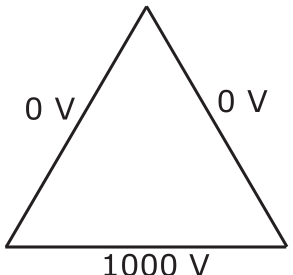

In [9]:
#Import library
from IPython.display import Image# Load image from local storage
Image(filename = "images/triangle.png", height = 200)

In [9]:
#LaplaceTri:  Laplace Eq field triangular capacitor
def LaplaceTri(Nmax = 100, Niter = 1000):
    V = zeros((Nmax,Nmax), float); grid = ones((Nmax, Nmax))
    sq3 = sqrt(3.)
    y0 = -sq3/4.
    def contour():   #Potential on one side
        for j in range(0, Nmax): V[0, j] = 1000 #Columns

    for i in range(0, Nmax):
        y = y0 + i*0.01
        x0 = -0.5
        for j in range(0, Nmax):
            x = x0 + j*0.01
            if (y <= sq3*(x + 0.25) and x<0.) or (y<-sq3*(x - 0.25) and x>= 0):
                grid[i, j] = 0
            else:
                if( y <= sq3/4. + 0.01):
                    V[i, j] = 0.0

    for iter in range (1, Niter):
        contour() #keep one side at 1000V
        for i in range(1, Nmax-2):
            for j in range(1, Nmax-2):
                if grid[i, j] == 0.: #interior points
                    V[i, j] = 0.25*( V[i+1,j] + V[i-1,j] + V[i,j+1] + V[i,j-1])

    x = range(0, Nmax - 1, 2)
    y = range(0, Nmax, 2)
    X, Y = p.meshgrid(x, y)

    def functz(V):
        z = V[X,Y]
        return z

    Z = functz(V)
    
    return X,Y,Z

x,y,v = LaplaceTri(Niter = 500)

#Gráfica con Plotly
fig = go.Figure(
    go.Surface(x=x, y=y, z = v,
               contours = {"x": {"show": True, "start": 2, "end": 100, "size": 5, "color":"black"},
                           "y": {"show": True, "start": 2, "end": 100, "size": 5, "color":"black"},
                           "z": {"show": True, "start": 0, "end": 1000,  "size": 100, "color":"black"}}
              )
)
fig.update_layout(
                  autosize=False,
                  margin=dict(l=20, r=20, t=20, b=20),
                  width=800, height=700,
                  paper_bgcolor='rgba(0,0,0,0)',
                  template = template,
                  scene_aspectmode='cube',
                  scene = dict( 
                      xaxis = dict(nticks=3),
                      yaxis = dict(nticks=3),
                      zaxis = dict(nticks=3),
                      zaxis_title = 'V(x,y)'
                              )
                  )
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))
fig.show()

## Obtener el potencial del modelo de un capacitor de placas paralelas de la figura siguiente resolviendo la ecuación de Poisson:

$$\nabla^2V(x) = 4\pi\rho(x)$$
$$V_{i,j} = \frac{1}{4}[V_{i+1,j} + V_{i-1,j} + V_{i,j+1} + V_{i,j-1}] + \pi\rho_{i,j}$$ 

## Se supone que la la placa superior tiene una densidad de carga constante $\rho$ mientras que la placa inferior tiene una densidad de carga $-\rho$

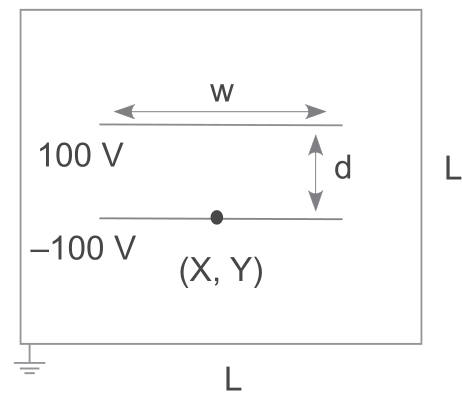

In [10]:
#Import library
from IPython.display import Image# Load image from local storage
Image(filename = "images/ParallelPlates.png", height = 200)

In [11]:
#LaplaceLine resuelve la ecuación de Laplace por relajación.

#plate_width es el ancho en en el eje x del capacitor
#plate_length el largo del capacitor, sobre el eje y

def LaplaceTwoLines(V0 = 100, ρ0 = 1, N = 100, Niter = 100, plate_width = 10, plate_length  = 15, d = 3):
    V = zeros((N, N), float)
    ρ = zeros((N, N), float)

    center = N/2; δ = d/2 ;
    
    lim1 = int(center - δ) - plate_width ;lim2 = int(center - δ)
    lim3 = int(center + δ); lim4 = int(center + δ) + plate_width
    l1 = int(center - 0.5*plate_length); l2 = int(center + 0.5*plate_length)
    
    plate_vpositions = np.concatenate((np.arange(lim1,lim2), np.arange(lim3,lim4)))
    plate_hpositions = np.arange(l1,l2)
    
    for w in range(plate_width):
        for k in plate_hpositions: 
            V[lim1 + w, k] = V0
            ρ[lim1 + w, k] = ρ0
        for k in plate_hpositions:
            V[lim3 + w, k] = -V0   
            ρ[lim1 + w, k] = -ρ0
            
    for iter in range(Niter):
        for i in range(1, N-1):
            for j in range(1, N-1):
                if (i in plate_vpositions) and (j in plate_hpositions):
                    V[i,j] = V[i,j]
                else:
                    V[i,j] = 0.25*(V[i+1,j] + V[i-1,j] + V[i,j+1] + V[i,j-1]) + np.pi*ρ[i,j]
                    
    x = range(N)
    y = range(N)
    X, Y = p.meshgrid(x, y)

    def functz(V):
        z = V[X,Y]
        return z

    Z = functz(V)
    return X, Y, Z

x,y,v = LaplaceTwoLines(N=100, Niter=200, plate_width=10, plate_length = 30, d=20)

#Gráfica con Plotly
fig = go.Figure(
    go.Surface(x=x, y=y, z = v,
               contours = {"x": {"show": True, "start": 2, "end": 100, "size": 2, "color":"black"},
                           "y": {"show": True, "start": 2, "end": 100, "size": 2, "color":"black"},
                           "z": {"show": True, "start": -100, "end": 100,  "size": 5, "color":"black"}},
              )
)
fig.update_layout(
                  autosize=False,
                  margin=dict(l=20, r=20, t=20, b=20),
                  width=800, height=700,
                  paper_bgcolor='rgba(0,0,0,0)',
                  template = template,
                  scene_aspectmode='cube',
                  scene = dict( 
                      xaxis = dict(nticks=3),
                      yaxis = dict(nticks=3),
                      zaxis = dict(nticks=3),
                      zaxis_title = 'V(x,y)'
                              )
                  )
fig.update_traces(contours_z=dict(show=True, usecolormap=True, 
                                  highlightcolor="limegreen", project_z=True))
fig.show()

In [58]:
    def LaplaceTwoInfinitePlanes(α = 30, V0 = 1, N = 100, Niter = 100, x_charge = 25, y_charge = 40, Q = 1,k=1,r_circ = 1):


        N_center = int(N/2)
        rads = α*(np.pi/180); 
        m = -tan(rads)
        b = (1-m)*N_center
        line = lambda x: int(m*x + b) 

        V = zeros((N,N), float)
        for iter in range (1, Niter):
            for i in range(1, N-1):
                for j in range(1, N-1):
                    if α <90:
                        if (j in range(N_center, N)) and (i == N_center or i ==line(j)):
                            V[i,j] = V0
                        else:
                            V[i,j] = 0.25*(V[i+1,j] + V[i-1,j] + V[i,j+1] + V[i,j-1])

                    elif α == 90:
                        if ((j == N_center) and (i in range(0, N_center))) or ( (j in range(N_center, N) and (i==N_center)) ):
                            V[i,j] = V0
                        else:
                            V[i,j] = 0.25*(V[i+1,j] + V[i-1,j] + V[i,j+1] + V[i,j-1])

                    elif α > 90:
                        if ((j in range(N_center)) and (i==line(j))) or ( (j in range(N_center, N) and (i==N_center)) ):
                            V[i,j] = V0
                        else:
                            V[i,j] = 0.25*(V[i+1,j] + V[i-1,j] + V[i,j+1] + V[i,j-1])

        V_planes = V

        #Cálculo del potencial de la carga puntual
        r = lambda x,y: np.sqrt( (x_charge - x)**2 + (y_charge - y)**2 )

        def charge_potential(x, y, k = k):
            return (k*Q)/r(x,y)


        V_charge = zeros((N,N), float)
        for i in range(N):
            for j in range(N):
                if j == y_charge and i == x_charge :
                    V_charge[i,j] = 0.
                elif (r(i,j)<=r_circ):
                        V_charge[i,j] = charge_potential(i,j)

        V = V_planes + V_charge

        x = range(0, N)
        y = range(0, N)
        x, y = p.meshgrid(x, y)
        v = V[x,y]

        #Gráfica con Plotly
        fig = go.Figure(
            go.Surface(x=x, y=y, z = v,
                       contours = {"x": {"show": True, "start": 0, "end": N, "size": 5, "color":"black"},
                                   "y": {"show": True, "start": 0, "end": N, "size": 5, "color":"black"},
                                   "z": {"show": True, "start": 0, "end": V0, "size": 2, "color":"black"}},
                      )
        )
        fig.update_layout(
                          autosize=False,
                          margin=dict(l=20, r=20, t=20, b=20),
                          width=800, height=700,
                          paper_bgcolor='rgba(0,0,0,0)',
                          template = template,
                          scene_aspectmode='cube',
                          scene = dict( 
                              xaxis = dict(nticks=3),
                              yaxis = dict(nticks=3),
                              zaxis = dict(nticks=3),
                              zaxis_title = 'V(x,y)'
                                      )
                          )
        fig.update_traces(contours_z=dict(show=True, usecolormap=True, 
                                          highlightcolor="limegreen", project_z=True))
        fig.show()
        return x,y,v,N,m
    

    N = 300
    x0 = int(N/2);y0 = int(N/2)
    x,y,V,N,m = LaplaceTwoInfinitePlanes(V0 = 5, α=45, N=N, Niter=100,  x_charge = x0 - 40, y_charge = y0+40, Q = 0, k = 1, r_circ = 100)

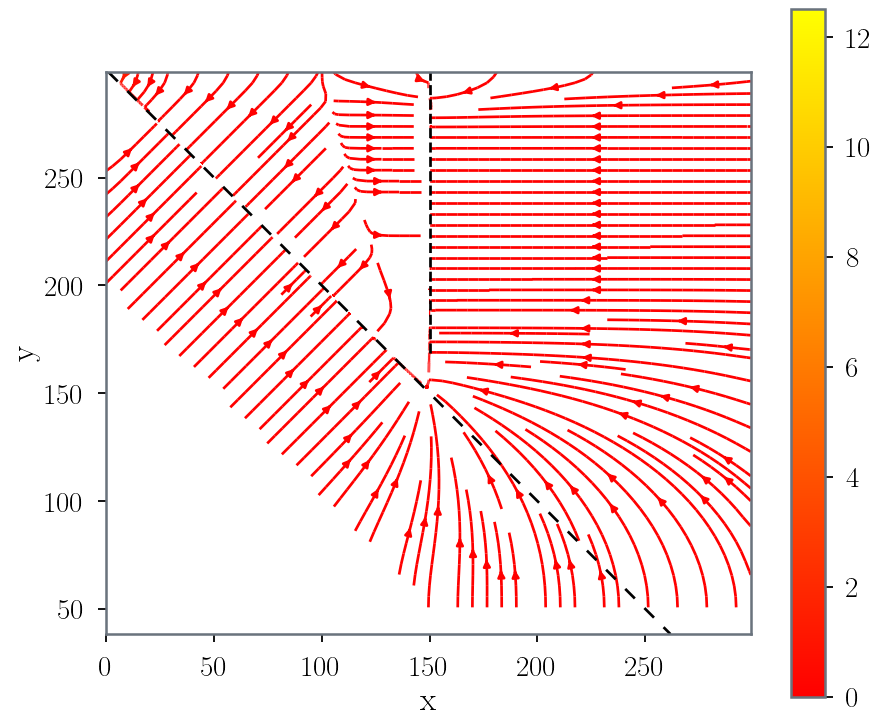

In [59]:
    Ej = zeros((N,N),float)
    Ei = zeros((N,N),float)
    for j in range(1,N-1):
        for i in range(1,N-1):
            Ej[i,j] = 0.5*(V[i+1,j] - V[i-1,j]) 

    for i in range(1,N-1):
        for j in range(1,N-1):
            Ei[i,j] = 0.5*(V[i,j+1] - V[i,j-1])

    E2 = Ej**2 + Ej**2
    fig = plt.figure()        
    ax = fig.add_subplot(111)
    strm = ax.streamplot(x, y, Ei, Ej,density=[1.5, 2], color = E2, cmap='autumn')
    fig.colorbar(strm.lines)
    ax.set_aspect('equal')
    ax.set_xlabel('x')
    ax.set_ylabel('y')

    x0 = int(N/2); y0 = int(N/2)
    ax.axline((x0, y0), slope = m, color='black', linestyle=(0, (5, 5)))
#     ax.axhline(y=y0, xmin=0, xmax=0.5, color="black", linestyle="--")
    ax.axvline(x=x0, ymin=0.5, ymax=1, color="black", linestyle="--")
    plt.show()

In [49]:
    h = 1

    ρi = zeros((N,N),float)
    ρj = zeros((N,N),float)

    for j in range(1,N-1):
        for i in range(1,N-1):
            ρj[i,j] = (V[i+1,j] - 2*V[i,j] + V[i-1,j])/(h**2)

    for i in range(1,N-1):
        for j in range(1,N-1):
            ρi[i,j] = (V[i,j+1] - 2*V[i,j] + V[i,j-1])/(h**2)
    
    ρ = ρi + ρj
        
    x = range(0, N)
    y = range(0, N)
    x, y = p.meshgrid(x, y)
    
    ρ = ρ[x,y]
    
    #Gráfica con Plotly
    fig = go.Figure(
        go.Surface(x=x, y=y, z = ρ,
                   contours = {"x": {"show": True, "start": 0, "end": N, "size": 5, "color":"black"},
                               "y": {"show": True, "start": 0, "end": N, "size": 5, "color":"black"}},
                  )
    )
    fig.update_layout(
                      autosize=False,
                      margin=dict(l=20, r=20, t=20, b=20),
                      width=800, height=700,
                      paper_bgcolor='rgba(0,0,0,0)',
                      template = template,
                      scene_aspectmode='cube',
                      scene = dict( 
                          xaxis = dict(nticks=3),
                          yaxis = dict(nticks=3),
                          zaxis = dict(nticks=3),
                          zaxis_title = r'$\rho(x,y)$'
                                  )
                      )
    fig.update_traces(contours_z=dict(show=True, usecolormap=True, 
                                      highlightcolor="limegreen", project_z=True))
    fig.show()

C:\Users\rafae\anaconda3\lib\site-packages\scipy\optimize\minpack.py:828: OptimizeWarning:

Covariance of the parameters could not be estimated



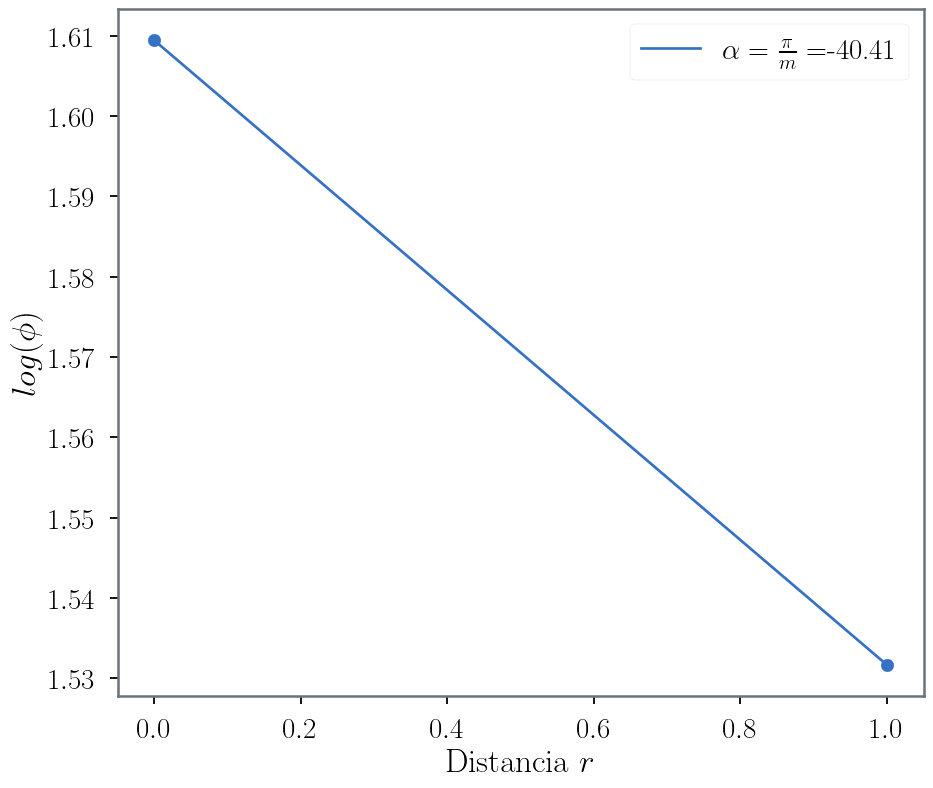

In [56]:
    dist = lambda x,y: np.sqrt(x**2 + y**2)
    r = []; ρr = []; ϕr = []
    i = x0
    for j in range(N):
        if (np.abs(ρ[i,j])>=0.1) and (dist(i-x0, j-y0)<2):
            ρr.append(ρ[i,j])
            ϕr.append(V[i,j])
            r.append(dist(i-x0, j-y0))
    
    fig, ax= plt.subplots()
    ax.scatter(r,np.log(ϕr))
    ax.set_xlabel(r'Distancia $r$')
    ax.set_ylabel(r'$log(\phi)$')


    # from scipy.optimize import curve_fit
    from scipy import optimize

    #Definición de función por ajustar
    def potential_fit(x,m,b):
        return m*x + b 

    p0 = [0,0] #definicion del prior
    popt, pcov = optimize.curve_fit(potential_fit, xdata = r, ydata = np.log(ϕr), p0=p0)
    m = popt[0]; α = np.pi/m
    x = np.linspace(min(r), max(r), 100)
    ax.plot(x, potential_fit(x,*popt), label = r'$\alpha = \frac{\pi}{m}=$' + r'{}'.format( round(α, 2) ) )
    ax.legend()
    plt.show()

Text(0, 0.5, 'Densidad de Carga $\\rho$')

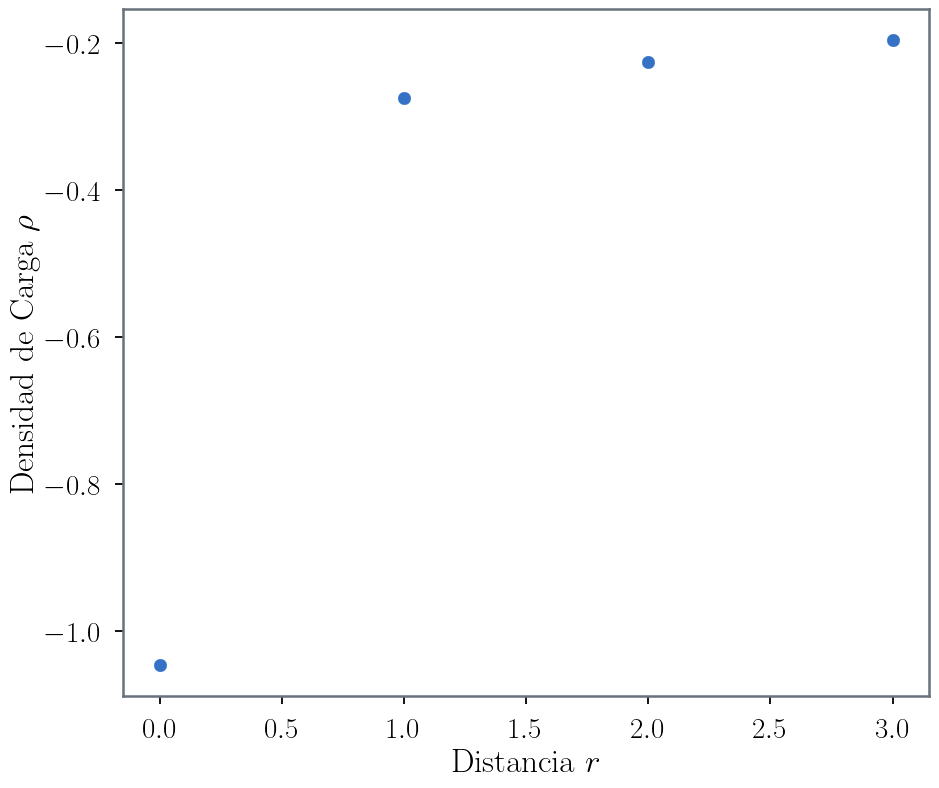

In [55]:
    fig, ax= plt.subplots()
    ax.scatter(r,ρr)
    ax.set_xlabel(r'Distancia $r$')
    ax.set_ylabel(r'Densidad de Carga $\rho$')
    

    #Definición de función por ajustar
#     def density_fit(x,m,b):
#         return m*x + b

#     p0 = [1,2,-1] #definicion del prior
#     popt, pcov = optimize.curve_fit(density_fit, xdata = r, ydata = ρr, p0=p0)
#     m = popt[0]; b = popt[1]
#     x = np.linspace(min(r), max(r), 100)
#     ax.plot(x, density_fit(x,*popt), label = r'$b=$' + r'{}'.format( round(b, 2) ) )
#     ax.legend()
#     plt.show()